In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.io import imread
#https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/gdrive/My Drive/icm_classificacao/stats_campinas_inteira.csv')
df = df.rename(columns={"0": "asfalto", "1": "arvore", "2":"cimento", "3":"telhado1", "4":"telhado2", "5":"telhado3", "6":"grama", "7":"piscina", "8":"solo", "9":"file"})
df.head()

,Unnamed: 0,asfalto,arvore,cimento,telhado1,telhado2,telhado3,grama,piscina,solo,file
0,0,0.0,2831.0,14133.0,10426.0,11280.0,1308.0,22.0,0.0,0.0,22558.0
1,1,0.0,19659.0,4060.0,9444.0,3219.0,548.0,2610.0,0.0,460.0,24611.0
2,2,0.0,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9914.0
3,3,12343.0,8622.0,3628.0,3512.0,329.0,0.0,11276.0,0.0,290.0,51147.0
4,4,1382.0,21774.0,8944.0,485.0,4240.0,2256.0,616.0,303.0,0.0,42167.0


In [ ]:
features = df[['asfalto', 'arvore', 'cimento', 'telhado1', 'telhado2', 'telhado3', 'grama', 'piscina', 'solo']]
files = list(df['file'])
files = [int(s) for s in files]
files = [str(s) + '.tif' for s in (files)]

In [ ]:
files = ['/content/gdrive/My Drive/icm_classificacao/images/' + i for i in files]

In [ ]:
features.shape

(55062, 9)

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=22)
kmeans.fit(features)

KMeans(n_clusters=10, random_state=22)

In [ ]:
features2 = features.copy()
features2['label_cluster'] = kmeans.labels_

In [ ]:
pca = PCA(2)
df_pca = pca.fit_transform(features)
df_pca = pd.DataFrame(df_pca)
df_pca['label_cluster'] = kmeans.labels_

In [ ]:
df_pca

,0,1,label_cluster
0,-2894.992991,-15634.003421,2
1,9933.809620,-1853.360921,9
2,28392.562057,10394.982046,3
3,-4970.179504,-311.842222,8
4,12546.138640,-940.114147,9
...,...,...,...
55057,13448.417942,-625.205251,9
55058,8734.079735,-3274.724550,9
55059,-6868.190766,427.795095,7
55060,-21965.587319,12531.430007,5


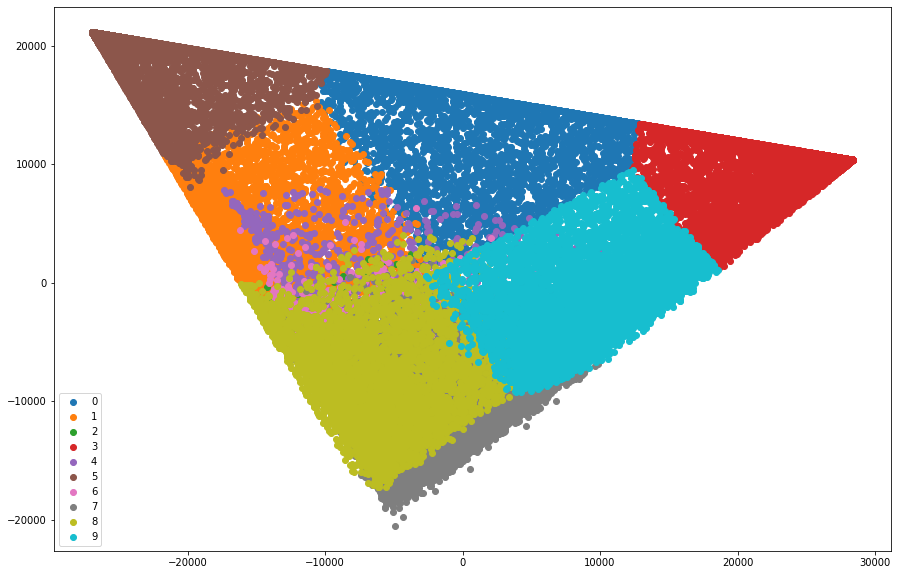

In [ ]:
u_labels = np.unique(kmeans.labels_)
fig = plt.figure(figsize=(15, 10))
for i in u_labels:
    plt.scatter(df_pca[df_pca['label_cluster'] == i][0] , df_pca[df_pca['label_cluster'] == i][1] , label = i)

plt.legend()
plt.show()

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=5, learning_rate = 500, n_iter=400, init='pca')
df_tsne = tsne.fit_transform(features)
df_tsne = pd.DataFrame(df_tsne)
df_tsne['label_cluster'] = kmeans.labels_

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 55062 samples in 0.118s...
[t-SNE] Computed neighbors for 55062 samples in 7.242s...
[t-SNE] Computed conditional probabilities for sample 1000 / 55062
[t-SNE] Computed conditional probabilities for sample 2000 / 55062
[t-SNE] Computed conditional probabilities for sample 3000 / 55062
[t-SNE] Computed conditional probabilities for sample 4000 / 55062
[t-SNE] Computed conditional probabilities for sample 5000 / 55062
[t-SNE] Computed conditional probabilities for sample 6000 / 55062
[t-SNE] Computed conditional probabilities for sample 7000 / 55062
[t-SNE] Computed conditional probabilities for sample 8000 / 55062
[t-SNE] Computed conditional probabilities for sample 9000 / 55062
[t-SNE] Computed conditional probabilities for sample 10000 / 55062
[t-SNE] Computed conditional probabilities for sample 11000 / 55062
[t-SNE] Computed conditional probabilities for sample 12000 / 55062
[t-SNE] Computed conditional probabilities for sam

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


[t-SNE] KL divergence after 250 iterations with early exaggeration: 137.317108
[t-SNE] KL divergence after 400 iterations: 5.725215


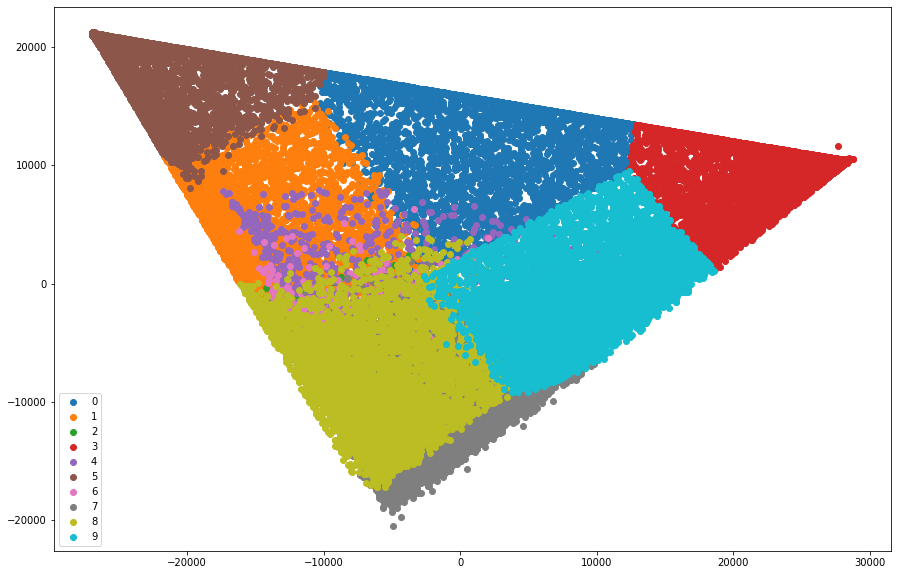

In [ ]:
u_labels = np.unique(kmeans.labels_)
fig = plt.figure(figsize=(15, 10))
for i in u_labels:
    plt.scatter(df_tsne[df_tsne['label_cluster'] == i][0] , df_tsne[df_tsne['label_cluster'] == i][1] , label = i)

plt.legend()
plt.show()

In [ ]:
groups = {}
for file, cluster in zip(files,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [ ]:
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 30:
        print(f"Clipping cluster size from {len(files)} to 30")
        files = files[:29]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);

        img = imread(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

In [ ]:
def plot_cluster_histogram(cluster, features):
  features_cluster = features.groupby('label_cluster').sum().iloc[cluster]
  values = list(features_cluster)
  values = [int(i) for i in values]
  print(values)

  fig = plt.figure(figsize=(8, 6))
  plt.bar(['asfalto', 'arvore', 'cimento', 'telhado1', 'telhado2', 'telhado3', 'grama', 'piscina', 'solo'], values)
  plt.xlabel("Feature")
  plt.ylabel("Quantidade de pixels no cluster")
  plt.title("Cluster {}".format(cluster))
  plt.show()

CLUSTER 0
Clipping cluster size from 3843 to 30


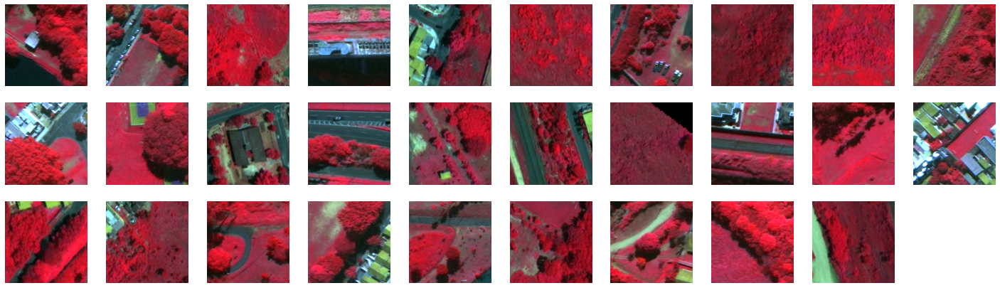

In [ ]:
print('CLUSTER 0')
view_cluster(0)

[5339796, 71212427, 2903455, 2312581, 1395188, 1393276, 64171326, 764718, 4227233]


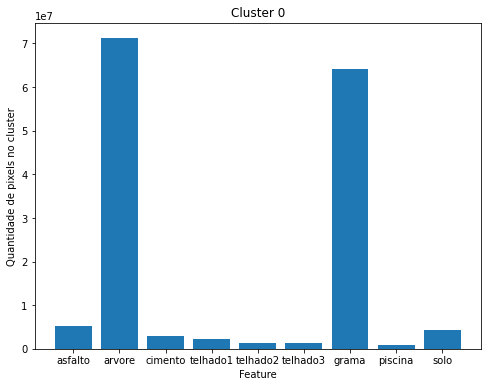

In [ ]:
plot_cluster_histogram(0, features2)

CLUSTER 1
Clipping cluster size from 4665 to 30


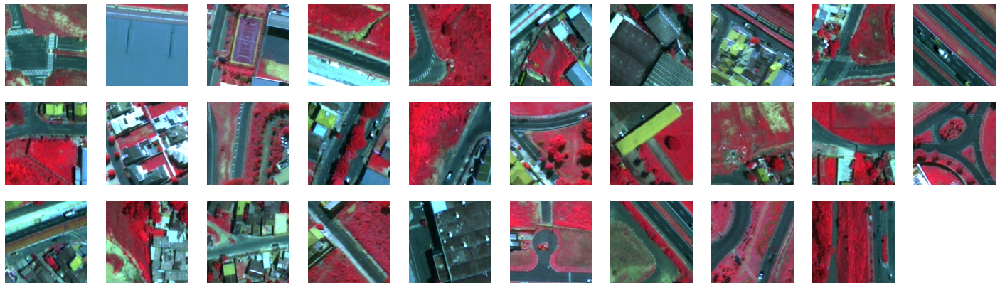

In [ ]:
print('CLUSTER 1')
view_cluster(1)

[32295045, 13859298, 15725785, 7832837, 6609798, 7554965, 90347675, 2028203, 10346394]


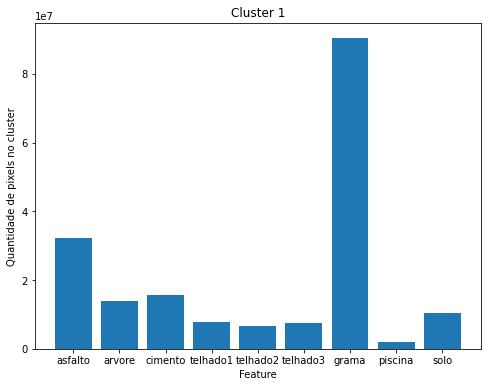

In [ ]:
plot_cluster_histogram(1, features2)

CLUSTER 2
Clipping cluster size from 5182 to 30


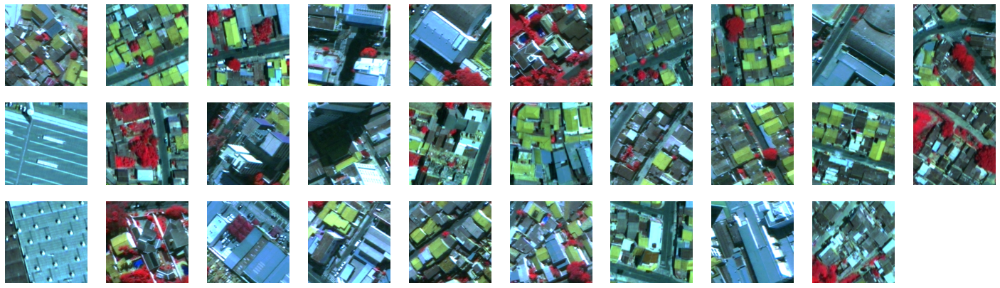

In [ ]:
print('CLUSTER 2')
view_cluster(2)

[20946429, 24566089, 33823904, 23843045, 68527941, 15833245, 12974673, 2960355, 3804319]


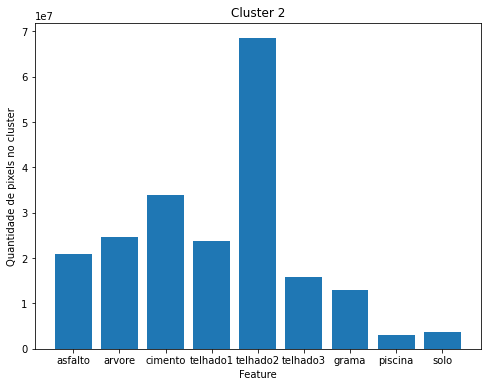

In [ ]:
plot_cluster_histogram(2, features2)

CLUSTER 3
Clipping cluster size from 8691 to 30


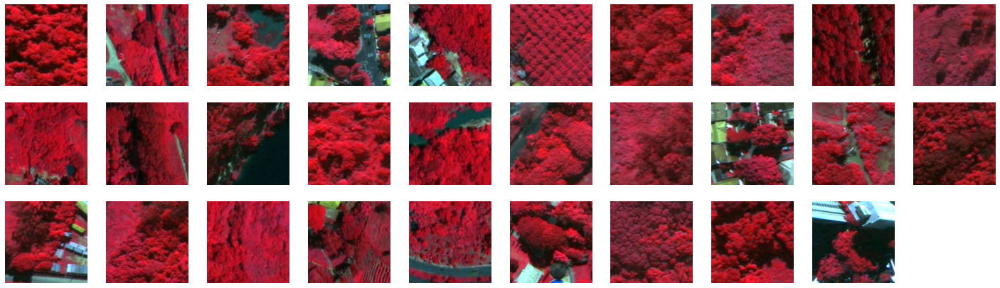

In [ ]:
print('CLUSTER 3')
view_cluster(3)

[5661979, 309237791, 3110176, 4736706, 3125474, 2171045, 14502515, 1506001, 3588313]


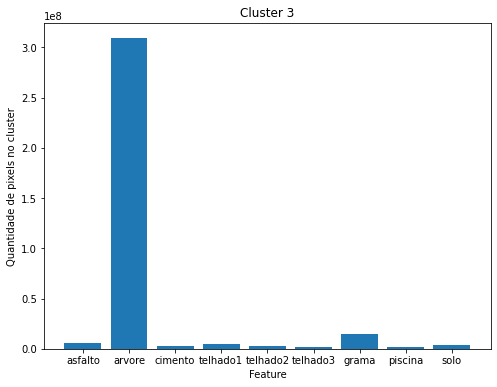

In [ ]:
plot_cluster_histogram(3, features2)

CLUSTER 4
Clipping cluster size from 1767 to 30


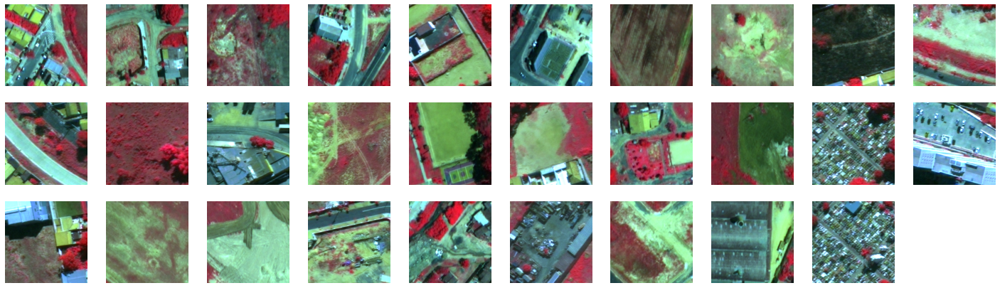

In [ ]:
print('CLUSTER 4')
view_cluster(4)

[3925863, 8687006, 2047397, 1478995, 1249264, 1347452, 10499840, 401553, 41042630]


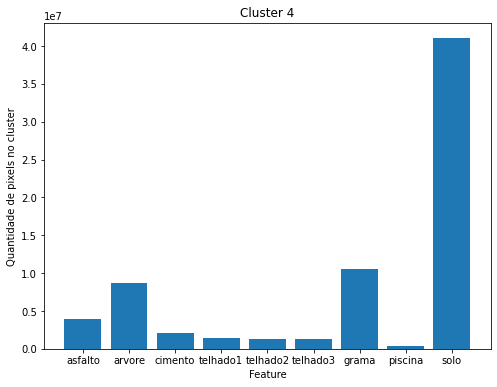

In [ ]:
plot_cluster_histogram(4, features2)

CLUSTER 5
Clipping cluster size from 5696 to 30


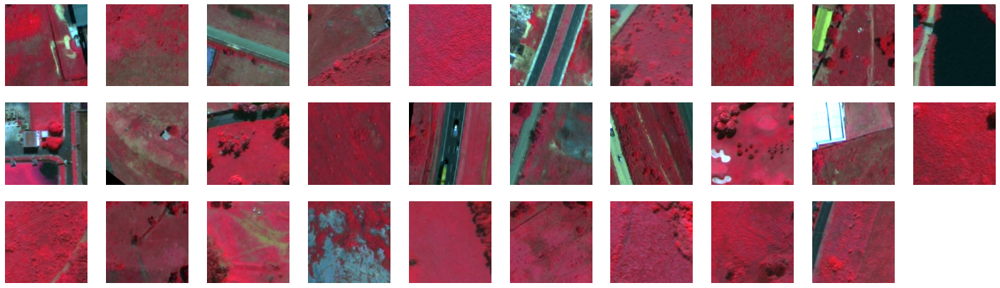

In [ ]:
print('CLUSTER 5')
view_cluster(5)

[5983965, 11908098, 1808111, 1028410, 489336, 985904, 201196293, 448642, 3991241]


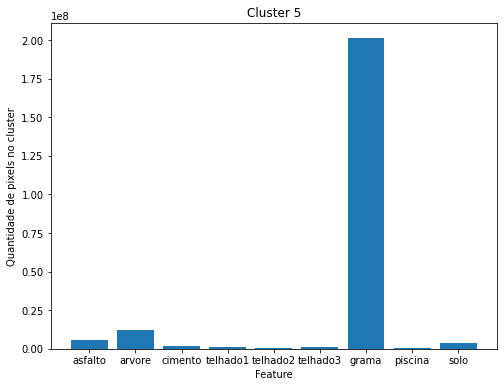

In [ ]:
plot_cluster_histogram(5, features2)

CLUSTER 6
Clipping cluster size from 2729 to 30


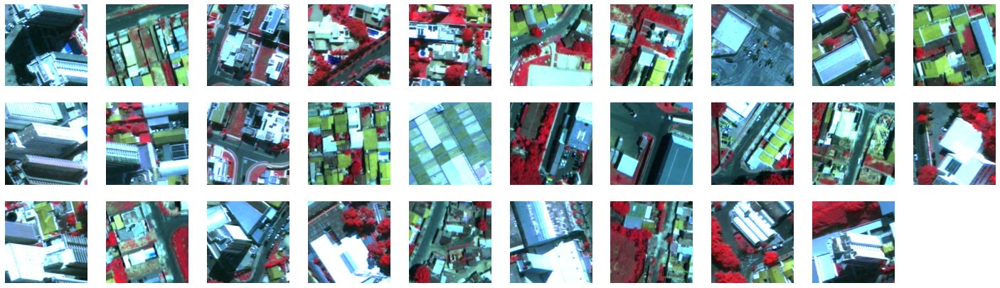

In [ ]:
print('CLUSTER 6')
view_cluster(6)

[10263960, 10803085, 15150012, 5829489, 9702964, 42017162, 10943948, 1676869, 2772511]


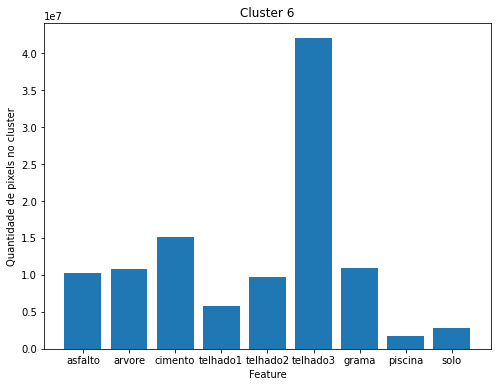

In [ ]:
plot_cluster_histogram(6, features2)

CLUSTER 7
Clipping cluster size from 9449 to 30


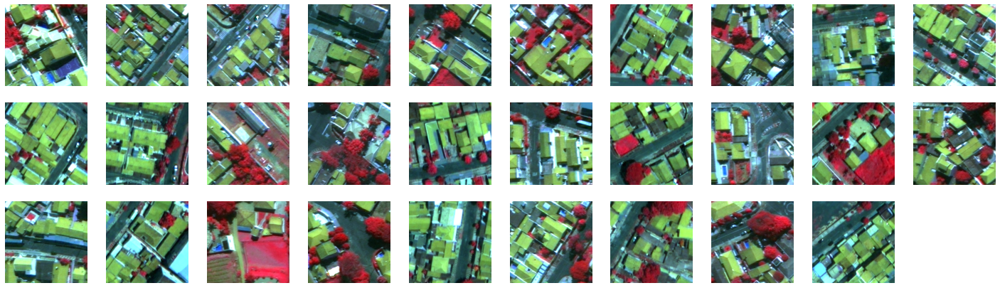

In [ ]:
print('CLUSTER 7')
view_cluster(7)

[51829705, 53603536, 49355011, 137159302, 33012197, 14852130, 24197257, 8041808, 5909054]


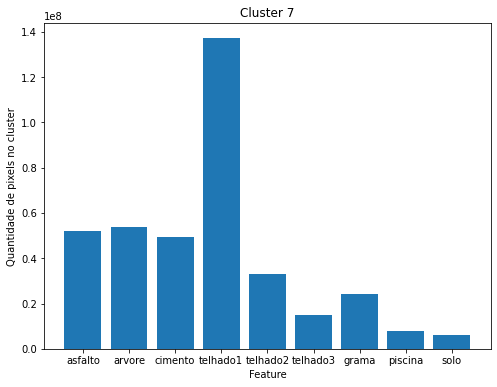

In [ ]:
plot_cluster_histogram(7, features2)

CLUSTER 8
Clipping cluster size from 5420 to 30


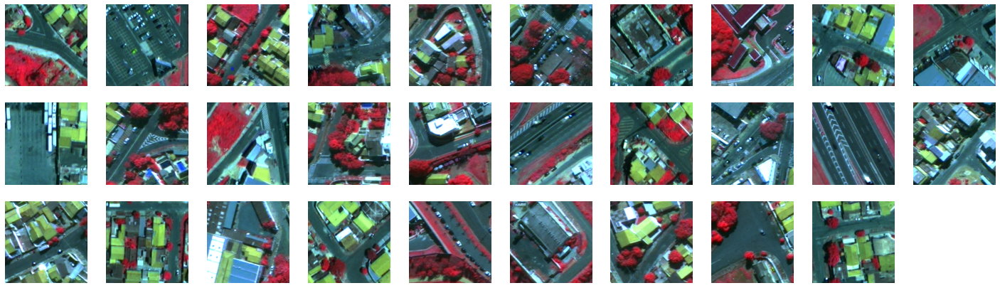

In [ ]:
print('CLUSTER 8')
view_cluster(8)

[74480359, 20917600, 29113413, 21904294, 15217414, 10443897, 31758335, 2782438, 10182250]


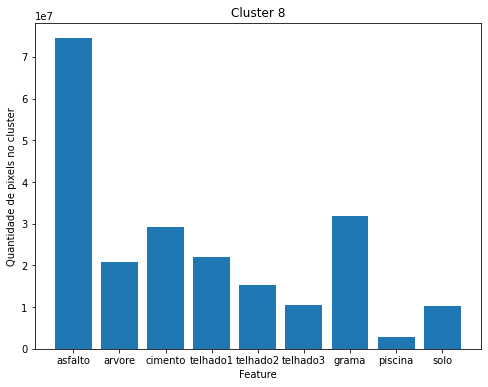

In [ ]:
plot_cluster_histogram(8, features2)

CLUSTER 9
Clipping cluster size from 7620 to 30


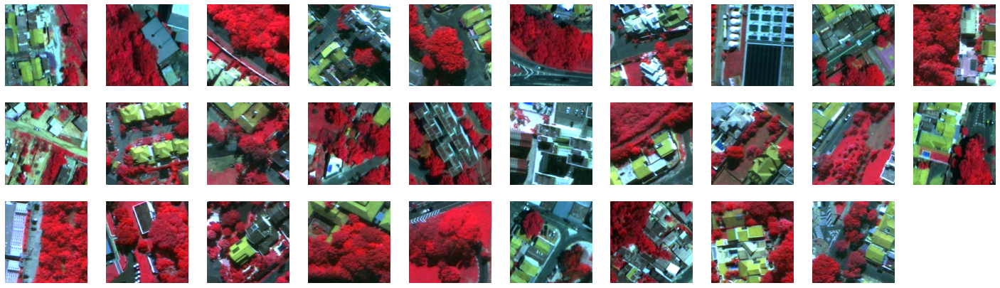

In [ ]:
print('CLUSTER 9')
view_cluster(9)

[25945527, 145006885, 25253845, 37395196, 23344912, 13976237, 18402323, 5169854, 10305221]


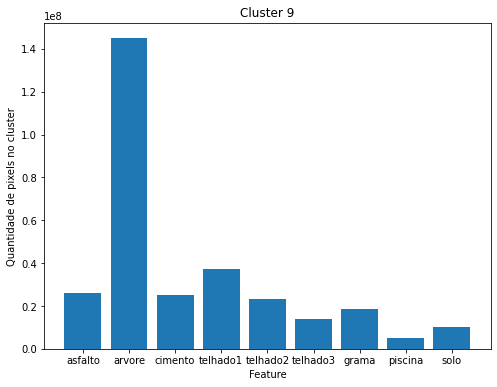

In [ ]:
plot_cluster_histogram(9, features2)